<a href="https://colab.research.google.com/github/ThaniNikolaou/DataJour/blob/main/HomeWork_Week8_NikolaouTheodora.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
from wordcloud import WordCloud
import seaborn as sns
import time

In [61]:
!python -m spacy download el_core_news_sm

2023-06-08 13:21:28.101969: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 98.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [3]:
start_page = 2             #06/06
end_page = 4               #04/06

start_url = 'https://www.newsbeast.gr/world/page/'

test_url = start_url + str(start_page)

In [4]:
response = requests.get(test_url)
doc = BeautifulSoup(response.text, 'html.parser')

In [5]:
teaser_articles_list = doc.find('main', {'class': 'jsx-4270303143 flxC mainWrapBody'}).find_all('article')

In [6]:
teaser_articles_list[0]

<article class="jsx-107431441 mobileFeed"><a class="imgLinkCnt" href="/world/arthro/9742561/ipa-sta-tartara-paramenei-to-pososto-dimotikotitas-tou-bainten"><div class="jsx-1699934498 img66 imageCnt"><picture class="loadingPicture"><source loading="lazy" sizes="100vw" srcset="/image/s360x/webp/file/files/1/2023/05/AP23125813384378.jpg 375w, /image/s640x/webp/file/files/1/2023/05/AP23125813384378.jpg 640w, /image/s750x/webp/file/files/1/2023/05/AP23125813384378.jpg 768w, /image/s440x/webp/file/files/1/2023/05/AP23125813384378.jpg 980w, /image/s380x/webp/file/files/1/2023/05/AP23125813384378.jpg 1100w, /image/s420x/webp/file/files/1/2023/05/AP23125813384378.jpg 1400w" type="image/webp"/><source loading="lazy" sizes="100vw" srcset="/image/s360x/file/files/1/2023/05/AP23125813384378.jpg 375w, /image/s640x/file/files/1/2023/05/AP23125813384378.jpg 640w, /image/s750x/file/files/1/2023/05/AP23125813384378.jpg 768w, /image/s440x/file/files/1/2023/05/AP23125813384378.jpg 980w, /image/s380x/file/

In [7]:
print(teaser_articles_list[0].prettify())

<article class="jsx-107431441 mobileFeed">
 <a class="imgLinkCnt" href="/world/arthro/9742561/ipa-sta-tartara-paramenei-to-pososto-dimotikotitas-tou-bainten">
  <div class="jsx-1699934498 img66 imageCnt">
   <picture class="loadingPicture">
    <source loading="lazy" sizes="100vw" srcset="/image/s360x/webp/file/files/1/2023/05/AP23125813384378.jpg 375w, /image/s640x/webp/file/files/1/2023/05/AP23125813384378.jpg 640w, /image/s750x/webp/file/files/1/2023/05/AP23125813384378.jpg 768w, /image/s440x/webp/file/files/1/2023/05/AP23125813384378.jpg 980w, /image/s380x/webp/file/files/1/2023/05/AP23125813384378.jpg 1100w, /image/s420x/webp/file/files/1/2023/05/AP23125813384378.jpg 1400w" type="image/webp"/>
    <source loading="lazy" sizes="100vw" srcset="/image/s360x/file/files/1/2023/05/AP23125813384378.jpg 375w, /image/s640x/file/files/1/2023/05/AP23125813384378.jpg 640w, /image/s750x/file/files/1/2023/05/AP23125813384378.jpg 768w, /image/s440x/file/files/1/2023/05/AP23125813384378.jpg 980w,

In [8]:
link = teaser_articles_list[0].find('a')['href']
print(link)

/world/arthro/9742561/ipa-sta-tartara-paramenei-to-pososto-dimotikotitas-tou-bainten


In [9]:
main_url = 'https://www.newsbeast.gr/'
article_link = main_url + link
print(article_link) 

https://www.newsbeast.gr//world/arthro/9742561/ipa-sta-tartara-paramenei-to-pososto-dimotikotitas-tou-bainten


In [10]:
teasers_list = []

for page_num in range(start_page, end_page+1):
  page_url = start_url + str(page_num)
  response = requests.get(page_url)
  doc = BeautifulSoup(response.text, 'html.parser')

  
  teaser_articles_list = doc.find('main', {'class': 'jsx-4270303143 flxC mainWrapBody'}).find_all('article')


  for teaser in teaser_articles_list:
      story_dict = {}
      try:
        
        
        link = teaser.find('a')['href'] 
        

        if link.startswith("http"):
          story_dict['url'] = link
        else:
          story_dict['url'] = main_url + link
      except:
        story_dict['url'] = ''
        pass
      teasers_list.append(story_dict)
  time.sleep(1)

In [11]:
newsbeast_world_df = pd.DataFrame(teasers_list)
newsbeast_world_df

,url
0,https://www.newsbeast.gr//world/arthro/9742561...
1,https://www.newsbeast.gr//world/arthro/9742561...
2,https://www.newsbeast.gr//world/arthro/9742529...
3,https://www.newsbeast.gr//world/arthro/9742529...
4,https://www.newsbeast.gr//environment/arthro/9...
...,...
295,https://www.newsbeast.gr//world/arthro/9733199...
296,https://www.newsbeast.gr//world/arthro/9733178...
297,https://www.newsbeast.gr//world/arthro/9733178...
298,https://www.newsbeast.gr//world/arthro/9731017...


ΓΙΑ ΝΑ ΣΩΣΕΙΣ ΤΟ csv ΠΡΕΠΕΙ ΝΑ ΒΑΛΕΙΣ TO PATH ΓΙΑ ΤΟ ΠΟΥ ΘΑ ΣΩΘΕΪ, slash, ΚΑΙ ΤΟ ΟΝΟΜΑ ΠΟΥ ΘΑ ΕΧΕΙ ΤΟ csv
π.χ. newsbeast_world_df.to_csv('content/drive/MyDrive/Colab Notebooks/newsbeast_teaser_urls.csv', index=False)

In [12]:
newsbeast_world_df.to_csv
newsbeast_world_df.to_csv('/content/sample_data/newsbeast_teaser_urls.csv', index=False)

In [13]:
article_url = 'https://www.newsbeast.gr/world/arthro/9741408/i-sanen-ntocherti-mila-gia-ti-machi-me-ton-karkino-i-axoniki-tomografia-edeixe-oti-echo-metastasi-ston-egkefalo'

In [14]:
response = requests.get(article_url)
doc = BeautifulSoup(response.text, 'html.parser')

print(doc.prettify #THANKYOU

In [15]:
article = doc.find('section', {'class': 'article__main'})
print(doc.prettify())

<!DOCTYPE html>
<html lang="el">
 <head>
  <link as="font" crossorigin="anonymous" href="/fonts/Impact.woff2" rel="preload" type="font/woff2"/>
  <link as="font" crossorigin="anonymous" href="/fonts/CFAstyStd-Book.woff2" rel="preload" type="font/woff2"/>
  <link as="font" crossorigin="anonymous" href="/fonts/CFAstyStd-Medium.woff2" rel="preload" type="font/woff2"/>
  <link as="font" crossorigin="anonymous" href="/fonts/PFHighwaySansPro-Bold.woff2" rel="preload" type="font/woff2"/>
  <link as="image" href="/img/mobileHeaderSharkBg_v3.jpg" rel="preload" type="image/webp"/>
  <link href="https://securepubads.g.doubleclick.net" rel="preconnect"/>
  <link href="/favicons/apple-touch-icon.png" rel="apple-touch-icon" sizes="180x180"/>
  <link href="/favicons/favicon-32x32.png" rel="icon" sizes="32x32" type="image/png"/>
  <link href="/favicons/favicon-16x16.png" rel="icon" sizes="16x16" type="image/png"/>
  <link href="/favicons/site.webmanifest" rel="manifest"/>
  <link color="#5bbad5" href=

In [16]:
section = doc.find('div', {'class': 'jsx-1366697334 categories info'}).text
section

'ΚΟΣΜΟΣ'

In [17]:
title = doc.find('h1').text
title

'Η Σάνεν Ντόχερτι μιλά για τη μάχη με τον καρκίνο: «Η αξονική τομογραφία έδειξε ότι έχω μετάσταση στον εγκέφαλο»'

In [18]:
date = doc.find('time')['datetime']
date

'2023-06-07T08:46:00Z'

In [19]:
paragraphs = doc.find_all('p')
paragraphs

[<p>Τη γενναία της μάχη με τον καρκίνο αποφάσισε να μοιραστεί με τους διαδικτυακούς της ακολούθους η διάσημη «Μπρέντα Γουόλς» από τα «Χτυποκάρδια στο Μπέβερλι Χιλς», <strong><a data-id="https://www.newsbeast.gr/tag/sanen-ntoxerti" data-type="URL" href="/tag/sanen-ntoxerti" rel="noopener" target="_blank">Σάνεν Ντόχερτι</a></strong>. Η ηθοποιός διαγνώστηκε με <strong>καρκίνο του μαστού στο τέταρτο στάδιο τον Φεβρουάριο του 2020</strong>.</p>,
 <p>Η 52χρονη ηθοποιός συγκλονίζει με τη νέα ανάρτησή της στα μέσα κοινωνικής δικτύωσης ανακοινώνοντας ότι η αξονική τομογραφία που πραγματοποιήθηκε στις 5 Ιανουαρίου έδειξε ότι<strong> είχε μετάσταση στον εγκέφαλο</strong>.</p>,
 <p>«Στις 12 Ιανουαρίου πραγματοποιήθηκε ο πρώτος κύκλος ακτινοβολίας», εξήγησε η ίδια σε ένα συγκλονιστικό βίντεο που μοιράστηκε στο Instagram. «Ο φόβος μου είναι προφανής. Είμαι εξαιρετικά κλειστοφοβική ενώ έχουν συμβεί πολλά στη ζωή μου. Είμαι τυχερή καθώς έχω σπουδαίους γιατρούς», συνέχισε η ηθοποιός. «<strong>Αλλά αυτό

In [20]:
p_texts_list = []                     
paragraphs = doc.find_all('p')    
for p in paragraphs:                  
  p_texts_list.append(p.text)         
full_text = ' '.join(p_texts_list)    
full_text = "".join(full_text.splitlines())
full_text

'Τη γενναία της μάχη με τον καρκίνο αποφάσισε να μοιραστεί με τους διαδικτυακούς της ακολούθους η διάσημη «Μπρέντα Γουόλς» από τα «Χτυποκάρδια στο Μπέβερλι Χιλς», Σάνεν Ντόχερτι. Η ηθοποιός διαγνώστηκε με καρκίνο του μαστού στο τέταρτο στάδιο τον Φεβρουάριο του 2020. Η 52χρονη ηθοποιός συγκλονίζει με τη νέα ανάρτησή της στα μέσα κοινωνικής δικτύωσης ανακοινώνοντας ότι η αξονική τομογραφία που πραγματοποιήθηκε στις 5 Ιανουαρίου έδειξε ότι είχε μετάσταση στον εγκέφαλο. «Στις 12 Ιανουαρίου πραγματοποιήθηκε ο πρώτος κύκλος ακτινοβολίας», εξήγησε η ίδια σε ένα συγκλονιστικό βίντεο που μοιράστηκε στο Instagram. «Ο φόβος μου είναι προφανής. Είμαι εξαιρετικά κλειστοφοβική ενώ έχουν συμβεί πολλά στη ζωή μου. Είμαι τυχερή καθώς έχω σπουδαίους γιατρούς», συνέχισε η ηθοποιός. «Αλλά αυτός ο φόβος… η αναταραχή… η χρονική στιγμή όλων αυτών… Έτσι μπορεί να μοιάζει ο καρκίνος». Μία ημέρα πριν, η Ντόχερτι είχε μοιραστεί ένα βίντεο στο Instagram με την ίδια να φορά τη μάσκα την οποία είχε στη διάρκεια τη

In [21]:
newsbeast_world_df = pd.read_csv('/content/sample_data/newsbeast_teaser_urls.csv')
newsbeast_world_df.head()

,url
0,https://www.newsbeast.gr//world/arthro/9742561...
1,https://www.newsbeast.gr//world/arthro/9742561...
2,https://www.newsbeast.gr//world/arthro/9742529...
3,https://www.newsbeast.gr//world/arthro/9742529...
4,https://www.newsbeast.gr//environment/arthro/9...


In [22]:
full_articles_list = []
for article_url in newsbeast_world_df['url']:
  response = requests.get(article_url)
  doc = BeautifulSoup(response.text, 'html.parser')

  
  article = doc.find('section', {'class': 'article__main'})

  full_article_dict = {}
  
  full_article_dict['site'] = "https://www.newsbeast.gr/"
  
  
  full_article_dict['url'] = article_url

  #section
  try:
    section = doc.find('div', {'class': 'jsx-1366697334 categories info'}).text
    full_article_dict['section'] = section
  except:
    full_article_dict['section'] = ''
    pass

  #title
  try:
    title = doc.find('h1').text
    full_article_dict['title'] = title
  except:
    full_article_dict['title'] = '' 
    pass

  # date
  try:
    date = doc.find('time')['datetime'] 
    full_article_dict['date'] = date
  except:
    full_article_dict['date'] = ''
    pass


  # full_text
  try:
    p_texts_list = []                      
    paragraphs = doc.find_all('p')    
    for p in paragraphs:                  
      p_texts_list.append(p.text)      
    full_text = ' '.join(p_texts_list)  
    full_text = "".join(full_text.splitlines())
    full_article_dict['full_text'] = full_text  
  except:
    full_article_dict['full_text'] = '' 
    pass

  full_articles_list.append(full_article_dict)
  time.sleep(1)

In [27]:
newsbeast_full_articles_df = pd.DataFrame(full_articles_list)
newsbeast_full_articles_df

,site,url,section,title,date,full_text
0,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742561...,ΚΟΣΜΟΣ,ΗΠΑ: Στα… τάρταρα παραμένει το ποσοστό δημοτικ...,2023-06-07T12:19:00Z,Το ποσοστό δημοτικότητας του αμερικανού προέδρ...
1,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742561...,ΚΟΣΜΟΣ,ΗΠΑ: Στα… τάρταρα παραμένει το ποσοστό δημοτικ...,2023-06-07T12:19:00Z,Το ποσοστό δημοτικότητας του αμερικανού προέδρ...
2,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742529...,ΚΟΣΜΟΣ,Η Ρωσία κατηγορεί την Ουκρανία ότι βομβάρδισε ...,2023-06-07T12:06:00Z,Ο κυβερνήτης της ρωσικής περιοχής Μπέλγκοροντ ...
3,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742529...,ΚΟΣΜΟΣ,Η Ρωσία κατηγορεί την Ουκρανία ότι βομβάρδισε ...,2023-06-07T12:06:00Z,Ο κυβερνήτης της ρωσικής περιοχής Μπέλγκοροντ ...
4,https://www.newsbeast.gr/,https://www.newsbeast.gr//environment/arthro/9...,ΠΕΡΙΒΑΛΛΟΝ,Η ρωσική εισβολή στην Ουκρανία προκαλεί εκπομπ...,2023-06-07T11:55:00Z,Η ρωσική εισβολή στην Ουκρανία έχει κατά τον π...
...,...,...,...,...,...,...
295,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9733199...,ΚΟΣΜΟΣ,OHE: «Ανεπαρκείς» οι πόροι που έχουν συγκεντρω...,2023-06-03T05:31:00Z,"Η υπηρεσία του ΟΗΕ, που είναι αρμόδια για την ..."
296,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9733178...,ΚΟΣΜΟΣ,Μπλόκο από τον κυβερνήτη του Τέξας στις θεραπε...,2023-06-03T05:13:00Z,"Ο κυβερνήτης του Τέξας, Γκρεγκ Άμπτο, υπέγραψε..."
297,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9733178...,ΚΟΣΜΟΣ,Μπλόκο από τον κυβερνήτη του Τέξας στις θεραπε...,2023-06-03T05:13:00Z,"Ο κυβερνήτης του Τέξας, Γκρεγκ Άμπτο, υπέγραψε..."
298,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9731017...,ΚΟΣΜΟΣ,"Οι τουρίστες στην Αθήνα, η διώρυγα και το ηλιο...",2023-06-03T05:04:00Z,Οι εξελίξεις παγκοσμίως τρέχουν και η πληροφόρ...


In [28]:
newsbeast_full_articles_df.to_csv
newsbeast_full_articles_df.to_csv('/content/sample_data/newsbeast_full_articles.csv', index=False)

In [29]:
newsbeast_full_articles_df.drop_duplicates(inplace=True)

In [30]:
newsbeast_full_articles_df.head(10)

,site,url,section,title,date,full_text
0,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742561...,ΚΟΣΜΟΣ,ΗΠΑ: Στα… τάρταρα παραμένει το ποσοστό δημοτικ...,2023-06-07T12:19:00Z,Το ποσοστό δημοτικότητας του αμερικανού προέδρ...
2,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742529...,ΚΟΣΜΟΣ,Η Ρωσία κατηγορεί την Ουκρανία ότι βομβάρδισε ...,2023-06-07T12:06:00Z,Ο κυβερνήτης της ρωσικής περιοχής Μπέλγκοροντ ...
4,https://www.newsbeast.gr/,https://www.newsbeast.gr//environment/arthro/9...,ΠΕΡΙΒΑΛΛΟΝ,Η ρωσική εισβολή στην Ουκρανία προκαλεί εκπομπ...,2023-06-07T11:55:00Z,Η ρωσική εισβολή στην Ουκρανία έχει κατά τον π...
6,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742289...,ΚΟΣΜΟΣ,Συνεχίζονται οι καταθέσεις του πρίγκιπα Χάρι κ...,2023-06-07T11:10:00Z,Οι καταθέσεις του πρίγκιπα Χάρι κατά του ομίλο...
8,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742292...,ΚΟΣΜΟΣ,Έκρηξη στο φράγμα Καχόβκα: «Η Ρωσία προκάλεσε ...,2023-06-07T10:40:00Z,Η Ρωσία προκάλεσε «μία από τις χειρότερες περι...
10,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9742041...,ΚΟΣΜΟΣ,Ρωσία για καταστροφή φράγματος: Διολιοφθορά απ...,2023-06-07T09:39:00Z,Σε κατάσταση έκτακτης ανάγκης τέθηκαν τμήματα ...
12,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9741861...,,Οι ΗΠΑ έχουν στην κατοχή τους άθικτα εξωγήινα ...,,Σάλο έχουν προκαλέσει οι ισχυρισμοί πρώην αξιω...
14,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9741408...,ΚΟΣΜΟΣ,Η Σάνεν Ντόχερτι μιλά για τη μάχη με τον καρκί...,2023-06-07T08:46:00Z,Τη γενναία της μάχη με τον καρκίνο αποφάσισε ν...
16,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9741213...,ΚΟΣΜΟΣ,Ο Πάπας Φραγκίσκος ξανά στο νοσοκομείο για εγχ...,2023-06-07T08:19:47Z,Επιστρέφει στο νοσοκομείο ο Πάπας Φραγκίσκος γ...
18,https://www.newsbeast.gr/,https://www.newsbeast.gr//world/arthro/9741251...,ΚΟΣΜΟΣ,Μεντβέντεφ: Η Ουκρανία έχει εξαπολύσει αντεπίθεση,2023-06-07T07:46:00Z,Ο πρώην πρόεδρος της Ρωσίας Ντμίτρι Μεντβέντεφ...


έχεις πάρει το κάθε άρθρο 2 φορές, γιατί όταν μάζευες τα άρθρα από τα teaser pages για το url ζητούσες το ```<a>``` tag. Κάθε άρθρο εχει όμως 2 ```<a>``` tags, οπότε σου έφερνε 2 links για κάθε άρθρο. Η κάθε σελίδα teaser έχει 50 άρθρα. έφερες 3 σελίδες, θα έπρεπε να έχεις 150 άρθρα, αλλά έχεις 300, γιατί είναι διπλά. 

Μπορείς να κάνεις drop.duplicates, δηλαδή να πετάξεις τις επαναλήψεις. Η εντόλή είναι της μορφής: ```df.drop.duplicates(inplace=True)```

In [ ]:
newsbeast_full_articles_df.loc[0, 'full_text']

In [32]:
short_newsbeast_df = newsbeast_full_articles_df[['date','title']]

In [33]:
short_newsbeast_df.head(10)

,date,title
0,2023-06-07T12:19:00Z,ΗΠΑ: Στα… τάρταρα παραμένει το ποσοστό δημοτικ...
2,2023-06-07T12:06:00Z,Η Ρωσία κατηγορεί την Ουκρανία ότι βομβάρδισε ...
4,2023-06-07T11:55:00Z,Η ρωσική εισβολή στην Ουκρανία προκαλεί εκπομπ...
6,2023-06-07T11:10:00Z,Συνεχίζονται οι καταθέσεις του πρίγκιπα Χάρι κ...
8,2023-06-07T10:40:00Z,Έκρηξη στο φράγμα Καχόβκα: «Η Ρωσία προκάλεσε ...
10,2023-06-07T09:39:00Z,Ρωσία για καταστροφή φράγματος: Διολιοφθορά απ...
12,,Οι ΗΠΑ έχουν στην κατοχή τους άθικτα εξωγήινα ...
14,2023-06-07T08:46:00Z,Η Σάνεν Ντόχερτι μιλά για τη μάχη με τον καρκί...
16,2023-06-07T08:19:47Z,Ο Πάπας Φραγκίσκος ξανά στο νοσοκομείο για εγχ...
18,2023-06-07T07:46:00Z,Μεντβέντεφ: Η Ουκρανία έχει εξαπολύσει αντεπίθεση


In [35]:
short2_newsbeast_df['year'] = pd.DatetimeIndex(short2_newsbeast_df['date']).year
short2_newsbeast_df['month'] = pd.DatetimeIndex(short2_newsbeast_df['date']).month
short2_newsbeast_df['day'] = pd.DatetimeIndex(short2_newsbeast_df['date']).day
short2_newsbeast_df['hour'] = pd.DatetimeIndex(short2_newsbeast_df['date']).hour

In [36]:
short_newsbeast_df

,date,title,year,month,day,hour
0,2023-06-07T12:19:00Z,ΗΠΑ: Στα… τάρταρα παραμένει το ποσοστό δημοτικ...,2023.0,6.0,7.0,12.0
2,2023-06-07T12:06:00Z,Η Ρωσία κατηγορεί την Ουκρανία ότι βομβάρδισε ...,2023.0,6.0,7.0,12.0
4,2023-06-07T11:55:00Z,Η ρωσική εισβολή στην Ουκρανία προκαλεί εκπομπ...,2023.0,6.0,7.0,11.0
6,2023-06-07T11:10:00Z,Συνεχίζονται οι καταθέσεις του πρίγκιπα Χάρι κ...,2023.0,6.0,7.0,11.0
8,2023-06-07T10:40:00Z,Έκρηξη στο φράγμα Καχόβκα: «Η Ρωσία προκάλεσε ...,2023.0,6.0,7.0,10.0
...,...,...,...,...,...,...
290,2023-06-03T06:27:00Z,Τουλάχιστον ένας νεκρός και δύο αγνοούμενοι απ...,2023.0,6.0,3.0,6.0
292,2023-06-03T06:09:00Z,Επικριτικός ο υπουργός Άμυνας των ΗΠΑ απέναντι...,2023.0,6.0,3.0,6.0
294,2023-06-03T05:31:00Z,OHE: «Ανεπαρκείς» οι πόροι που έχουν συγκεντρω...,2023.0,6.0,3.0,5.0
296,2023-06-03T05:13:00Z,Μπλόκο από τον κυβερνήτη του Τέξας στις θεραπε...,2023.0,6.0,3.0,5.0


<Axes: >

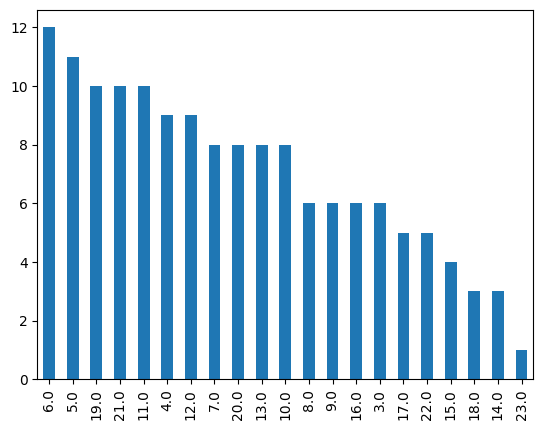

In [37]:
short_newsbeast_df['hour'].value_counts().plot(kind='bar')

<Axes: >

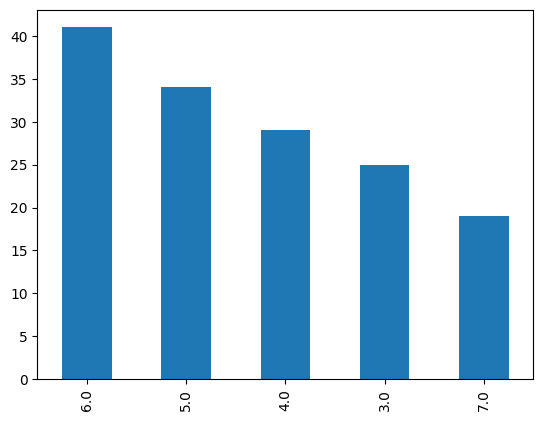

In [38]:
short_newsbeast_df['day'].value_counts().plot(kind='bar')

In [39]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [49]:
short2_newsbeast_df = newsbeast_full_articles_df[['date','full_text']]

In [53]:
short2_newsbeast_df['year'] = pd.DatetimeIndex(short2_newsbeast_df['date']).year
short2_newsbeast_df['month'] = pd.DatetimeIndex(short2_newsbeast_df['date']).month
short2_newsbeast_df['day'] = pd.DatetimeIndex(short2_newsbeast_df['date']).day
short2_newsbeast_df['hour'] = pd.DatetimeIndex(short2_newsbeast_df['date']).hour

In [ ]:
short2_newsbeast_df[short_newsbeast_df['day']==4.0]['full_text']

In [56]:
text = short2_newsbeast_df[short2_newsbeast_df['day']==4.0]['full_text'].str.cat(sep = ' ')

In [ ]:
text

In [62]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
list(nlp.Defaults.stop_words)[0:20]

In [68]:
doc = nlp(short2_newsbeast_df['full_text'][0])

In [ ]:
for token in doc:
    print(token, token.lemma_)

In [ ]:
' '.join(token.lemma_ for token in doc)

In [ ]:
text

In [72]:
full_doc = nlp(text)

In [73]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [ ]:
clear_text[200:400]

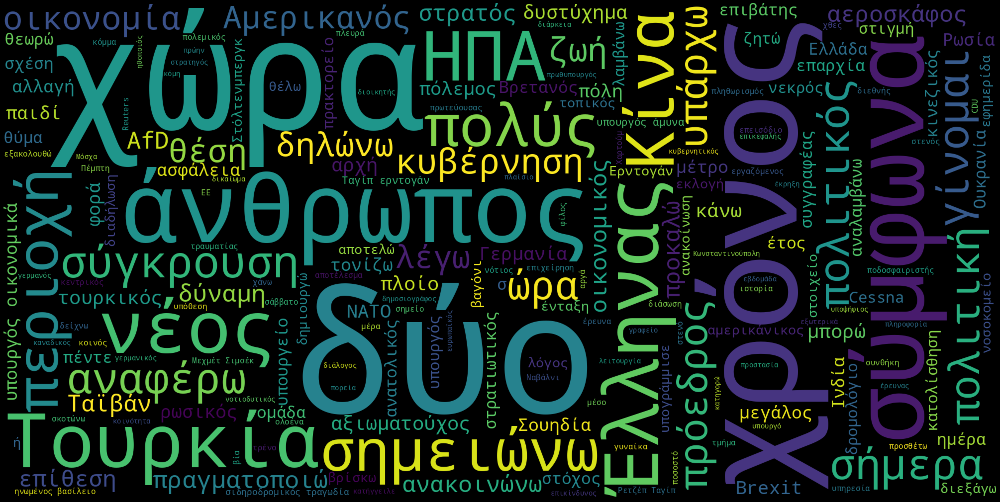

In [107]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [76]:
short3_newsbeast_df = newsbeast_full_articles_df[['date','full_text']]

In [78]:
short3_newsbeast_df['year'] = pd.DatetimeIndex(short3_newsbeast_df['date']).year
short3_newsbeast_df['month'] = pd.DatetimeIndex(short3_newsbeast_df['date']).month
short3_newsbeast_df['day'] = pd.DatetimeIndex(short3_newsbeast_df['date']).day
short3_newsbeast_df['hour'] = pd.DatetimeIndex(short3_newsbeast_df['date']).hour

In [ ]:
short3_newsbeast_df[short_newsbeast_df['day']==5.0]['full_text']

In [80]:
text3 = short3_newsbeast_df[short3_newsbeast_df['day']==5.0]['full_text'].str.cat(sep = ' ')

In [ ]:
text3

In [ ]:
list(nlp.Defaults.stop_words)[0:20]

In [83]:
doc = nlp(short3_newsbeast_df['full_text'][0])

In [ ]:
for token in doc:
    print(token, token.lemma_)

In [ ]:
' '.join(token.lemma_ for token in doc)

In [ ]:
text3

In [87]:
full_doc3 = nlp(text3)

In [88]:
clear_text3 = ' '.join(token.lemma_ for token in full_doc3)

In [ ]:
clear_text3[200:400]

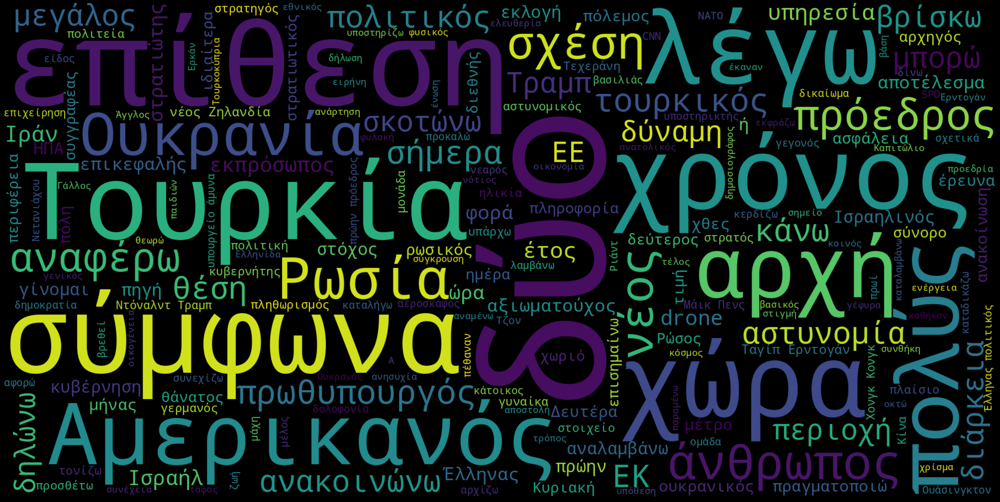

In [108]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text3)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [92]:
short4_newsbeast_df = newsbeast_full_articles_df[['date','full_text']]

In [94]:
short4_newsbeast_df['year'] = pd.DatetimeIndex(short4_newsbeast_df['date']).year
short4_newsbeast_df['month'] = pd.DatetimeIndex(short4_newsbeast_df['date']).month
short4_newsbeast_df['day'] = pd.DatetimeIndex(short4_newsbeast_df['date']).day
short4_newsbeast_df['hour'] = pd.DatetimeIndex(short4_newsbeast_df['date']).hour

In [ ]:
short4_newsbeast_df[short_newsbeast_df['day']==6.0]['full_text']

In [96]:
text4 = short4_newsbeast_df[short4_newsbeast_df['day']==6.0]['full_text'].str.cat(sep = ' ')

In [ ]:
text4

In [ ]:
list(nlp.Defaults.stop_words)[0:20]

In [99]:
doc = nlp(short4_newsbeast_df['full_text'][0])

In [ ]:
for token in doc:
    print(token, token.lemma_)

In [ ]:
' '.join(token.lemma_ for token in doc)

In [ ]:
text4

In [103]:
full_doc4 = nlp(text4)

In [104]:
clear_text4 = ' '.join(token.lemma_ for token in full_doc4)

In [ ]:
clear_text4[200:400]

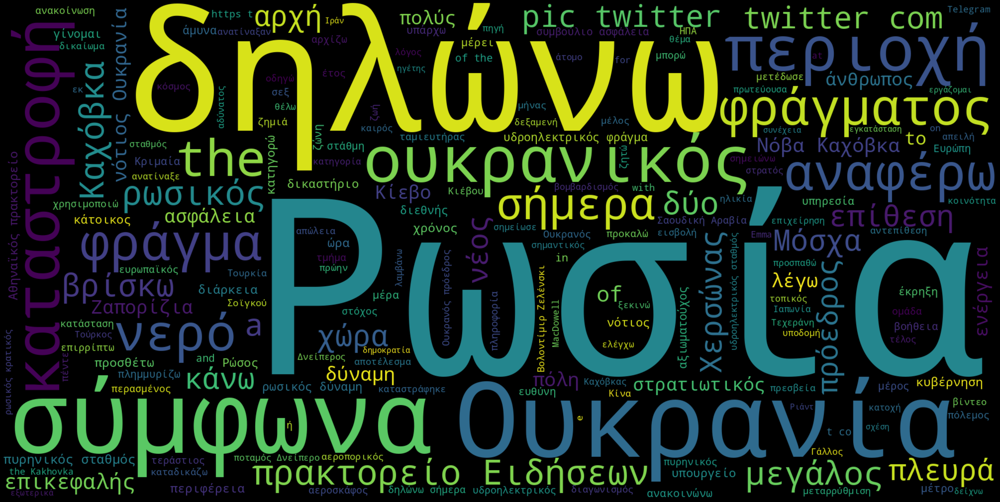

In [109]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text4)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# Τα ευρήματά μας στα παραπάνω διαγράμματα, προέρχονται από την μελέτη που έγινε σε άρθρα της ιστοσελίδας newsbeast, από την κατηγορία "ΚΟΣΜΟΣ" από τις 04/06 έως τις 06/06. Γενικότερα παρατηρούμε ότι, οι περισσότερες ειδήσεις σε αυτή την κατηγορία αναρτώνται στις 06:00 το πρωί. Μεγαλύτερη πληθώρα άρθρων αναρτήθηκε στις 06/06, όπου, όπως βλέπουμε και στο σχετικό "Συννεφόλεξο", κυριαρχούν οι λέξεις "Ρωσία", "Ουκρανία", "καταστροφή". Στις 04/06 και στις 05/06 εμφανίζονται συχνότερα μέσα στα άρθρα οι λέξεις "Τουρκία", "Αμερική", "χρόνος", "άνθρωπος".